# EveryBeam LOFAR LBA integration tests

These tests are all setup and explained in `test_installation/everybeam/test_NWA.ipynb`, so check that out first if you haven't already. In short, we'll check we can make images of the LBA primary beam, that the beams interact with Stokes polarisation correctly, and that we can change frequency and time correctly.

Goes without saying, but these tests rely on `everybeam` being installed.

In [4]:
import sys
##This line is to make EveryBeam work on my machine; adjust as necessary for yours
sys.path.append('/home/jline/software/installed/lib/python3.12/site-packages')
sys.path.append('../../scripts')

from run_woden import main as run_woden

from subprocess import call
from astropy.io import fits
import numpy as np
from astropy.table import Column, Table
from astropy.time import Time
from astropy.coordinates import SkyCoord
from astropy.coordinates import EarthLocation
from astropy import units as u
import matplotlib.pyplot as plt
import numpy.testing as npt
from astropy.constants import c
from astropy.wcs import WCS
import everybeam as eb
import erfa

##A bunch of test and plotting code lives here so we can use it in multile notebooks
from wodenpy.primary_beam.use_everybeam import load_MWA_telescope, load_OSKAR_telescope, load_LOFAR_telescope, run_everybeam, radec_to_xyz, run_everybeam_over_threads
##A bunch of test and plotting code lives here so we can use it in multile notebooks
from eb_testing_code import create_WCS, plot_jones_on_sky, plot_everybeam_on_sky, make_sky_models, read_uvfits, convert_inst_to_stokes, test_stokes_recovery, getFDF, findpeaks, test_RM_recovery, make_RM_skymodel

from wodenpy.array_layout.precession import RTS_Precess_LST_Lat_to_J2000

C = c.to('m/s').value

ra0 = 0
dec0 = 53

lofar_lat = 52.905329712
lofar_long = 6.867996528

##pick a time/date that sticks our phase centre overhead
date = "2024-07-21T03:35:00"
##Assume that the OSKAR telescope is near the MWA??
lofar_location = EarthLocation(lat=lofar_lat*u.deg, 
                               lon=lofar_long*u.deg)

observing_time = Time(date, scale='utc', location=lofar_location)

##Grab the LST
LST = observing_time.sidereal_time('mean')
LST_deg = LST.value*15
print(f"LST: {LST_deg} deg, RA: {ra0}")

LST: 0.01862197128531748 deg, RA: 0


## Image the beam on the sky

First up, let's see if we can just plot a LOFAR station beam to check it looks sensible.

Thread 2 processing coords 2500 to 3750
Thread 1 processing coords 1250 to 2500Thread 0 processing coords 0 to 1250
Thread 3 processing coords 3750 to 5000

Thread 5 processing coords 6250 to 7500Thread 4 processing coords 5000 to 6250Thread 6 processing coords 7500 to 8750


Thread 7 processing coords 8750 to 10000
Thread 1 finishedThread 4 finishedThread 6 finished

Thread 7 finishedThread 0 finished
Thread 3 finished

Thread 2 finished

Thread 5 finished


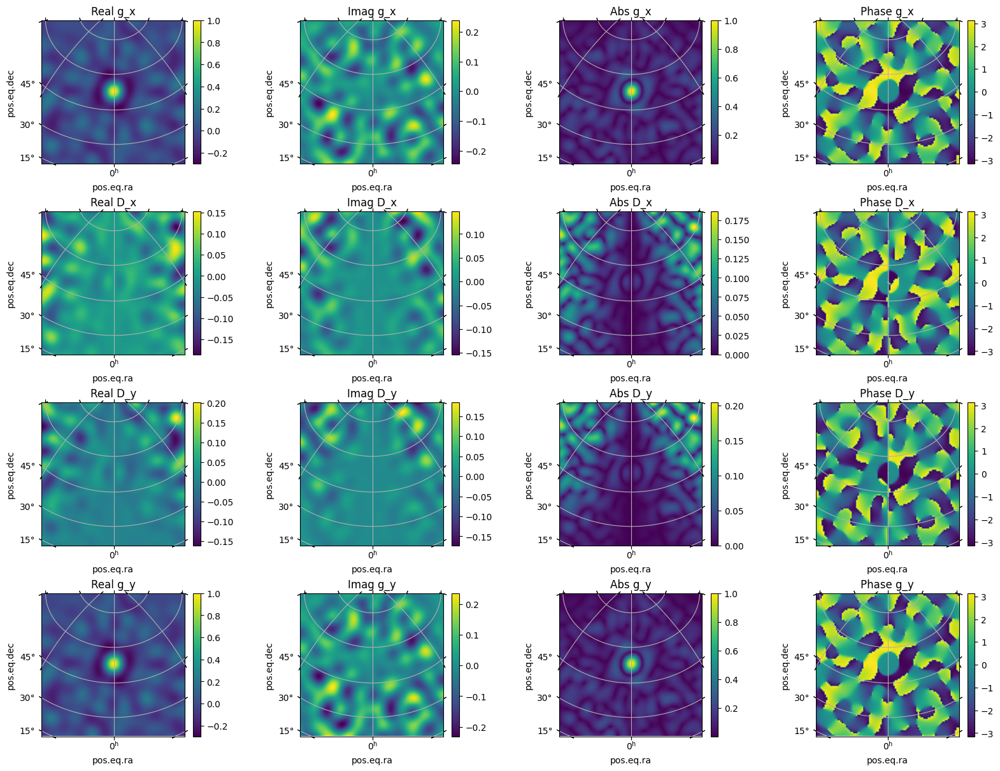

In [6]:
##setup coords
nside = 100
radec_reso = 60 / nside
header, wcs = create_WCS(ra0, dec0, nside, radec_reso)
x_mesh, y_mesh = np.meshgrid(np.arange(nside), np.arange(nside))
ras, decs = wcs.all_pix2world(x_mesh, y_mesh, 0)
ras = np.radians(ras.flatten())
decs = np.radians(decs.flatten())

##Path to example MS
ms_path="lba.MS"

freq = 50e+6
station_id = 0

##Technically we don't need to do this here, but in WODEN proper, we
##precess the array back to J2000 rather than precessing the sky forward
##So doing it here to show you what is happening under the hood
mjd_current = observing_time.mjd
lst_J2000, latitude_J2000 = RTS_Precess_LST_Lat_to_J2000(np.radians(LST_deg),
                                                         np.radians(lofar_lat),
                                                         mjd_current)

##Stick all our variables in lists as `run_everybeam` is designed to be
## run over multiple times/frequencies
j2000_latitudes = [latitude_J2000]
j2000_lsts = [lst_J2000]
times = [observing_time]
freqs = [freq]
station_ids = [0]
##Everybeam doesn't need a coeff path for this beam
coeff_path=""

##We'll run EveryBeam in parallel to speed things up
num_threads=8

all_jones = run_everybeam_over_threads(num_threads, ms_path,
                            coeff_path,
                            ras, decs,
                            np.radians(ra0), np.radians(dec0),
                            j2000_latitudes, j2000_lsts,
                            np.radians(lofar_lat), np.radians(lofar_long),
                            times, freqs, station_ids,
                            use_differential_beam=False,
                            apply_beam_norms=True,
                            reorder_jones=False,
                            parallactic_rotate=False,
                            eb_rotate=True)

beam_ind, time_ind, freq_ind = 0, 0, 0

all_gx = all_jones[beam_ind, time_ind, freq_ind, :, 0, 0]
all_Dx = all_jones[beam_ind, time_ind, freq_ind, :, 0, 1]
all_Dy = all_jones[beam_ind, time_ind, freq_ind, :, 1, 0]
all_gy = all_jones[beam_ind, time_ind, freq_ind, :, 1, 1]

all_gx.shape = (nside, nside)
all_Dx.shape = (nside, nside)
all_Dy.shape = (nside, nside)
all_gy.shape = (nside, nside)

plot_jones_on_sky(all_gx, all_Dx, all_Dy, all_gy, wcs)

This looks decent, gains look way stronger than the leakages because I've set up the `run_everybeam` function to do a normalistion towards the beam phase centre. However, these beams aren't aligned north-east and south-west as the dipoles are different in a LOFAR station.

## Off cardinal dipoles

This brings up a need for new functionality in `WODEN` to handle 45/135 deg dipoles. As noted in Table 4.1 of TMS, the combinations of Stokes IQUV parameters measured by each instrumental polarisation are different as compared to 0/90 deg dipoles. This means we need a different mixing matrix. If we label the 45/135 deg dipoles as p and q, then the instrumental visibilities are:

$$
\begin{bmatrix}
\mathrm{V}_{pp} \\
\mathrm{V}_{pq} \\
\mathrm{V}_{qp} \\
\mathrm{V}_{qq} \\
\end{bmatrix}
=
\begin{bmatrix}
1 & 0 & 1 & 0 \\
0 & -1 & 0 & j \\
0 & -1 & 0 & -j \\
1 & 0 & -1 & 0 \\
\end{bmatrix}
\begin{bmatrix}
\mathrm{V}_I \\
\mathrm{V}_Q \\
\mathrm{V}_U \\
\mathrm{V}_V \\
\end{bmatrix}
$$

<!-- ```
\mathrm{V}_I = 0.5 * (\mathrm{V}_pp + \mathrm{V}_qq)
\mathrm{V}_Q = 0.5 * (\mathrm{V}_pp - \mathrm{V}_qq)
\mathrm{V}_U = 0.5 * (\mathrm{V}_pq + \mathrm{V}_qp)
\mathrm{V}_V = 0.5j * (\mathrm{V}_pq - \mathrm{V}_qp)
``` -->

If we then say the beam Jones matrix is:

$$
\mathbf{J} =
\begin{bmatrix}
g_p & D_p \\
D_q & g_q \\
\end{bmatrix}
$$


then the measured visibilities between antennas 1 and 2 are:

$$
   \begin{bmatrix}
   \mathrm{V}_{12\,pp} \\
   \mathrm{V}_{12\,pq} \\
   \mathrm{V}_{12\,qp} \\
   \mathrm{V}_{12\,qq} \\
   \end{bmatrix} =
   \mathbf{J}_1 \otimes \mathbf{J}_2^*
   \begin{bmatrix}
    1 & 0 & 1 & 0 \\
    0 & -1 & 0 & i \\
    0 & -1 & 0 & -i \\
    1 & 0 & -1 & 0 \\
   \end{bmatrix}
   \begin{bmatrix}
   \mathrm{V}_{12\,I} \\
   \mathrm{V}_{12\,Q} \\
   \mathrm{V}_{12\,U} \\
   \mathrm{V}_{12\,V}
   \end{bmatrix}
$$


$$=
   \begin{bmatrix}
   g_{1p} g_{2p}^* & g_{1p} D_{2p}^* & D_{1p} g_{2p}^* & D_{1p} D_{2p}^* \\
   g_{1p} D_{2q}^* & g_{1p} g_{2q}^* & D_{1p} D_{2q}^* & D_{1p} g_{2q}^* \\
   D_{1q} g_{2p}^* & D_{1q} D_{2p}^* & g_{1q} g_{2p}^* & g_{1q} D_{2p}^* \\
   D_{1q} D_{2q}^* & D_{1q} g_{2q}^* & g_{1q} D_{2q}^* & g_{1q} g_{2q}^*
   \end{bmatrix}
   \begin{bmatrix}
    1 & 0 & 1 & 0 \\
    0 & -1 & 0 & i \\
    0 & -1 & 0 & -i \\
    1 & 0 & -1 & 0 \\
   \end{bmatrix}
   \begin{bmatrix}
   \mathrm{V}_{12\,I} \\
   \mathrm{V}_{12\,Q} \\
   \mathrm{V}_{12\,U} \\
   \mathrm{V}_{12\,V}
   \end{bmatrix}
$$



$$=
   \begin{bmatrix}
   g_{1p} g_{2p}^* + D_{1p} D_{2p}^* & -g_{1p} D_{2p}^* - D_{1p} g_{2p}^* & g_{1p} g_{2p}^* - D_{1p} D_{2p}^* & i(g_{1p} D_{2p}^* -D_{1p} g_{2p}^*) \\
   g_{1p} D_{2q}^* + D_{1p} g_{2q}^* & -g_{1p} g_{2q}^* - D_{1p} D_{2q}^*  &  g_{1p} D_{2q}^* - D_{1p} g_{2q}^* & i(g_{1p} g_{2q}^* -D_{1p} D_{2q}^*)  \\
   D_{1q} g_{2p}^* + g_{1q} D_{2p}^* & -D_{1q} D_{2p}^* - g_{1q} g_{2p}^* & D_{1q} g_{2p}^* - g_{1q} D_{2p}^* & i(D_{1q} D_{2p}^* -g_{1q} g_{2p}^*) \\
   D_{1q} D_{2q}^* + g_{1q} g_{2q}^*  & -D_{1q} g_{2q}^* - g_{1q} D_{2q}^*  & D_{1q} D_{2q}^* - g_{1q} g_{2q}^* & i(D_{1q} g_{2q}^* -g_{1q} D_{2q}^*)  \\
   \end{bmatrix}
   \begin{bmatrix}
   \mathrm{V}_{12\,I} \\
   \mathrm{V}_{12\,Q} \\
   \mathrm{V}_{12\,U} \\
   \mathrm{V}_{12\,V}
   \end{bmatrix}
$$

$$
\begin{align*}
\mathrm{V}_{12\,pp} = (g_{1p} g_{2p}^* + D_{1p} D_{2p}^*)\mathrm{V}_{12\,I} - (g_{1p} D_{2p}^* + D_{1p} g_{2p}^*)\mathrm{V}_{12\,Q} \\+ (g_{1p} g_{2p}^* - D_{1p} D_{2p}^*)\mathrm{V}_{12\,U} + i(g_{1p} D_{2p}^* - D_{1p} g_{2p}^*)\mathrm{V}_{12\,V}
\end{align*}
$$
$$
\begin{align*}
\mathrm{V}_{12\,pq} = (g_{1p} D_{2q}^* + D_{1p} g_{2q}^*)\mathrm{V}_{12\,I} - (g_{1p} g_{2q}^* + D_{1p} D_{2q}^*)\mathrm{V}_{12\,Q} \\+ (g_{1p} D_{2q}^* - D_{1p} g_{2q}^*)\mathrm{V}_{12\,U} + i(g_{1p} g_{2q}^* -D_{1p} D_{2q}^*)\mathrm{V}_{12\,V}
\end{align*}
$$
$$
\begin{align*}
\mathrm{V}_{12\,qp} = (D_{1q} g_{2p}^* + g_{1q} D_{2p}^*)\mathrm{V}_{12\,I} - (D_{1q} D_{2p}^* + g_{1q} g_{2p}^*)\mathrm{V}_{12\,Q} \\+ (D_{1q} g_{2p}^* - g_{1q} D_{2p}^*)\mathrm{V}_{12\,U} + i(D_{1q} D_{2p}^* -g_{1q} g_{2p}^*)\mathrm{V}_{12\,V} 
\end{align*}
$$
$$
\begin{align*}
\mathrm{V}_{12\,qq} = (D_{1q} D_{2q}^* + g_{1q} g_{2q}^*)\mathrm{V}_{12\,I}  - (D_{1q} g_{2q}^* + g_{1q} D_{2q}^*)\mathrm{V}_{12\,Q}  \\+ (D_{1q} D_{2q}^* - g_{1q} g_{2q}^*)\mathrm{V}_{12\,U} + i(D_{1q} g_{2q}^* -g_{1q} D_{2q}^*)\mathrm{V}_{12\,V} 
\end{align*}
$$




Repeating the whole process but ignoring the beam, we see that

$$
\begin{align*}
\mathrm{V}_{pp} = \mathrm{V}_{I} + \mathrm{V}_{U}
\end{align*}
$$
$$
\begin{align*}
\mathrm{V}_{pq} = -\mathrm{V}_{Q} + i\mathrm{V}_{V}
\end{align*}
$$
$$
\begin{align*}
\mathrm{V}_{qp} = -\mathrm{V}_{Q} - i\mathrm{V}_{V}
\end{align*}
$$
$$
\begin{align*}
\mathrm{V}_{qq} = \mathrm{V}_{I} - \mathrm{V}_{U}
\end{align*}
$$

Rearranging this we see to recover Stokes IQUV visibilities, we obviously need a different set of equations compared to 0/90 deg dipoles. These are

$$
\begin{align*}
\mathrm{V}_{I} = \frac{\mathrm{V}_{pp} + \mathrm{V}_{qq}}{2}
\end{align*}
$$
$$
\begin{align*}
\mathrm{V}_{Q} = -\frac{\mathrm{V}_{pq} + \mathrm{V}_{qp}}{2}
\end{align*}
$$
$$
\begin{align*}
\mathrm{V}_{U} = \frac{\mathrm{V}_{pp} - \mathrm{V}_{qq}}{2}
\end{align*}
$$
$$
\begin{align*}
\mathrm{V}_{V} = \frac{\mathrm{V}_{qp} - \mathrm{V}_{pq}}{2i}
\end{align*}
$$


This maths has been added to `WODEN`. Loading a `LOFAR` beam model should trigger the correct mixing matrix to be used, but there is also a `--off_cardinal_dipoles` flag that can be set to force the use of the off cardinal mixing matrix.

## Stokes recovery with off cardinal dipoles
Let's try to recover single point source of either Stokes I, Q, U or V. First of all, we'll do it without any primary beam effects, to check the mixing matrix. We'll then add the primary beam effects and see how it affects the recovery.

In [7]:
make_sky_models(ra0, dec0)

freq_reso = 1e+6
low_freq = 100e+6
high_freq = 150e+6

num_freq_chans = int((high_freq - low_freq) / freq_reso)

primary_beam = "none"

for pol in ['I', 'Q', 'U', 'V']:
# for pol in ['I']:

    uvfits_name = f"stokes{pol}_{primary_beam}"
    cat_name = f'{pol}_source.fits'
    
    args = []
    
    ##The command to run WODEN
    args.append(f'--ra0={ra0}')
    args.append(f'--dec0={dec0}')
    args.append(f'--latitude={lofar_lat}')
    args.append(f'--longitude={lofar_long}')
    args.append(f'--date={date}')
    args.append(f'--output_uvfits_prepend={uvfits_name}')
    args.append(f'--cat_filename={cat_name}')
    args.append(f'--primary_beam={primary_beam}')
    args.append(f'--lowest_channel_freq={low_freq}')
    args.append(f'--freq_res={freq_reso}')
    args.append(f'--num_freq_channels={num_freq_chans}')
    args.append(f'--band_nums=1')
    args.append(f'--time_res=2')
    args.append(f'--num_time_steps=1')
    args.append(f'--IAU_order')
    args.append(f'--off_cardinal_dipoles')
    args.append('--num_threads=1')
    args.append(f'--beam_ms_path=lba.MS')

    run_woden(args)

Successful readonly open of default-locked table lba.MS/ANTENNA: 10 columns, 37 rows
You are using WODEN commit: No git describe nor __version__ avaible
LOADING IN /home/jline/software/WODEN_dev/wodenpy/libwoden_double.so
Setting phase centre RA,DEC 0.00000deg 53.00000deg
Obs epoch initial LST was 0.0228000546 deg
Setting initial J2000 LST to 359.7122369008 deg
Setting initial mjd to 60512.1493171296
After precession initial latitude of the array is 52.7688502802 deg
We are precessing the array
Doing the initial reading/mapping of sky model into chunks
INFO: couldn't find second table containing shapelet information, so not attempting to load any shapelets.
Mapping took 0.0 mins
Have read in 1 components
After cropping there are 1 components
From Set 0 thread num 0 reading 1 points, 0 gauss, 0 shape, 0 shape coeffs using thread id 0
Finshed thread 0 in 0.0 seconds
Sending set 0 to GPU
NO PRIMARY BEAM HAS BEEN SELECTED
	Will run without a primary beam
Set 0 has returned from the GPU aft

In [8]:
for pol in ['I', 'Q', 'U', 'V']:
    uvfits_name = f"stokes{pol}_none"
    XX, XY, YX, YY = read_uvfits(f'{uvfits_name}_band01.uvfits')
    
    ##on_cardinal=False means we're using the maths above to recombine the
    ##XX, XY, YX, YY into Stokes I, Q, U, V
    test_stokes_recovery(pol, 'none', atol=5e-2, on_cardinal=False)
    
    # ##uncomment to print out the exact values recovered
    # ##pick a random baseline to print, they should all be the sam
    # baseline = 0
    # ##Supply on_cardinal=False to use the right maths
    # recover_I, recover_Q, recover_U, recover_V = convert_inst_to_stokes(XX[baseline], XY[baseline], YX[baseline], YY[baseline],
    #                                             on_cardinal=False)
    
    # print(f"Input {pol}, Recover I {recover_I[0].real:.2f}, Q {recover_Q[0].real:.2f}, U {recover_U[0].real:.2f}, V {recover_V[0].real:.2f}")

Testing Stokes I
Stokes I passed
Testing Stokes Q
Stokes Q passed
Testing Stokes U
Stokes U passed
Testing Stokes V
Stokes V passed


Sweeeeet, works in the case of no primary beam. How about when we add the `LOFAR` primary beam?

In [9]:
make_sky_models(ra0, dec0)

freq_reso=1e+6
low_freq=100e+6
high_freq = 150e+6
num_freq_chans = int((high_freq - low_freq) / freq_reso)
primary_beam = "everybeam_LOFAR"

for pol in ['I', 'Q', 'U', 'V']:

    uvfits_name = f"stokes{pol}_{primary_beam}"
    cat_name = f'{pol}_source.fits'
    
    args = []
    
    ##The command to run WODEN
    args.append(f'--ra0={ra0}')
    args.append(f'--dec0={dec0}')
    args.append(f'--latitude={lofar_lat}')
    args.append(f'--longitude={lofar_long}')
    args.append(f'--date={date}')
    args.append(f'--output_uvfits_prepend={uvfits_name}')
    args.append(f'--cat_filename={cat_name}')
    args.append(f'--primary_beam={primary_beam}')
    args.append(f'--lowest_channel_freq={low_freq}')
    args.append(f'--freq_res={freq_reso}')
    args.append(f'--num_freq_channels={num_freq_chans}')
    args.append(f'--band_nums=1')
    args.append(f'--time_res=2')
    args.append(f'--num_time_steps=1')
    args.append(f'--IAU_order')
    # args.append(f'--off_cardinal_dipoles')
    args.append('--num_threads=1')
    args.append(f'--station_id=0')
    args.append(f'--beam_ms_path=lba.MS')

    run_woden(args)

Successful readonly open of default-locked table lba.MS/ANTENNA: 10 columns, 37 rows
You are using WODEN commit: No git describe nor __version__ avaible
LOADING IN /home/jline/software/WODEN_dev/wodenpy/libwoden_double.so
Setting phase centre RA,DEC 0.00000deg 53.00000deg
Obs epoch initial LST was 0.0228000546 deg
Setting initial J2000 LST to 359.7122369008 deg
Setting initial mjd to 60512.1493171296
After precession initial latitude of the array is 52.7688502802 deg
We are precessing the array
Doing the initial reading/mapping of sky model into chunks
INFO: couldn't find second table containing shapelet information, so not attempting to load any shapelets.
Mapping took 0.0 mins
Have read in 1 components
After cropping there are 1 components
From Set 0 thread num 0 reading 1 points, 0 gauss, 0 shape, 0 shape coeffs using thread id 0
Finshed thread 0 in 0.2 seconds
Sending set 0 to GPU
Set 0 has returned from the GPU after 0.1 seconds
Successful readonly open of default-locked table lba

In [10]:
for pol in ['I', 'Q', 'U', 'V']:
    uvfits_name = f"stokes{pol}_everybeam_LOFAR"
    XX, XY, YX, YY = read_uvfits(f'{uvfits_name}_band01.uvfits')
    
    ##on_cardinal=False means we're using the maths above to recombine the
    ##XX, XY, YX, YY into Stokes I, Q, U, V
    test_stokes_recovery(pol, 'none', atol=5e-2, on_cardinal=False)
    
    # ##uncomment to print out the exact values recovered
    # ##pick a random baseline to print, they should all be the sam
    # baseline = 0
    # ##Supply on_cardinal=False to use the right maths
    # recover_I, recover_Q, recover_U, recover_V = convert_inst_to_stokes(XX[baseline], XY[baseline], YX[baseline], YY[baseline],
    #                                             on_cardinal=False)
    
    # print(f"Input {pol}, Recover I {recover_I[0].real:.2f}, Q {recover_Q[0].real:.2f}, U {recover_U[0].real:.2f}, V {recover_V[0].real:.2f}")

Testing Stokes I
Stokes I passed
Testing Stokes Q
Stokes Q passed
Testing Stokes U
Stokes U passed
Testing Stokes V
Stokes V passed


Booya, works perfectly. Now to test the RM recovery.

## RM recovery

In [11]:
phi_RM, pol_frac = make_RM_skymodel(ra0, dec0)

freq_reso = 0.1e+6
low_freq = 100e+6
high_freq = 130e+6
num_freq_chans = int((high_freq - low_freq) / freq_reso)


primary_beam = "everybeam_LOFAR"

uvfits_name = f"rm_source_{primary_beam}"
cat_name = 'RM_source.fits'

##The command to run WODEN
command = f'run_woden.py --ra0={ra0} --dec0={dec0} '
command += f'--date={date} --output_uvfits_prepend={uvfits_name} '
command += f'--latitude={lofar_lat} --longitude={lofar_long} '
command += f'--cat_filename={cat_name} --primary_beam={primary_beam} '
command += f'--lowest_channel_freq={low_freq} --freq_res={freq_reso} '
command += f'--num_freq_channels={num_freq_chans} --band_nums=1 '
command += f'--time_res=2 --num_time_steps=1 --IAU_order --num_threads=1 '
command += f' --station_id=0 '
command += f'--beam_ms_path=lba.MS'

call(command, shell=True)

/home/jline/software/anaconda3/envs/woden_dev/bin/run_woden.py:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('wodenpy==2.3.0')


Successful readonly open of default-locked table lba.MS/ANTENNA: 10 columns, 37 rows
You are using WODEN commit: No git describe nor __version__ avaible
LOADING IN /home/jline/software/WODEN_dev/wodenpy/libwoden_double.so
Setting phase centre RA,DEC 0.00000deg 53.00000deg
Obs epoch initial LST was 0.0228000546 deg
Setting initial J2000 LST to 359.7122369008 deg
Setting initial mjd to 60512.1493171296
After precession initial latitude of the array is 52.7688502802 deg
We are precessing the array
Doing the initial reading/mapping of sky model into chunks
INFO: couldn't find second table containing shapelet information, so not attempting to load any shapelets.
Mapping took 0.0 mins
Have read in 1 components
After cropping there are 1 components
From Set 0 thread num 0 reading 1 points, 0 gauss, 0 shape, 0 shape coeffs using thread id 0
Finshed thread 0 in 0.2 seconds
Sending set 0 to GPU
Set 0 has returned from the GPU after 0.3 seconds


0

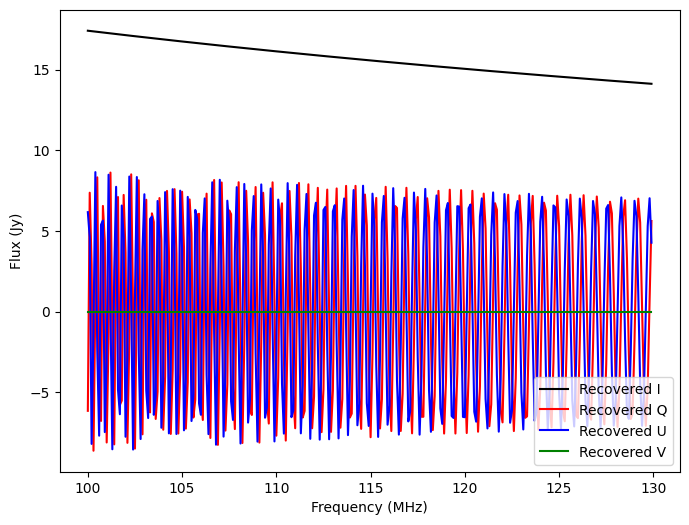

In [12]:
XX, XY, YX, YY = read_uvfits('rm_source_everybeam_LOFAR_band01.uvfits')
baseline = 0    
recover_I, recover_Q, recover_U, recover_V = convert_inst_to_stokes(XX[baseline], XY[baseline], YX[baseline], YY[baseline],
                                                                    on_cardinal=False)

    
freqs = np.arange(low_freq, high_freq, freq_reso)

fig, axs = plt.subplots(1, 1, figsize=(8, 6))

axs.plot(freqs / 1e+6, recover_I.real, 'k-', label='Recovered I')
axs.plot(freqs / 1e+6, recover_Q.real, 'r', label='Recovered Q')
axs.plot(freqs / 1e+6, recover_U.real, 'b', label='Recovered U')
axs.plot(freqs / 1e+6, recover_V.real, 'g', label='Recovered V')

axs.legend()

axs.set_xlabel('Frequency (MHz)')
axs.set_ylabel('Flux (Jy)')

plt.show()

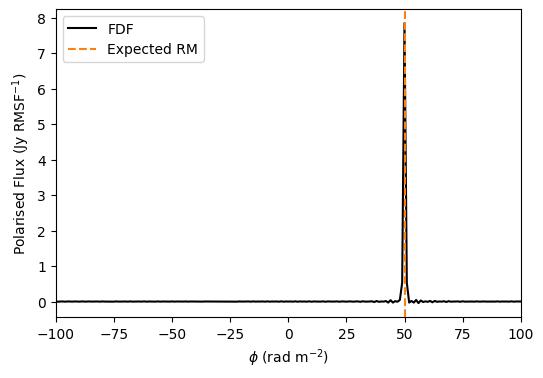

Recovered RM: 50.0 Expected RM: 50
Recovered Pol. Fraction: 0.5 Expected Pol Fraction 0.5


In [13]:
test_RM_recovery(uvfits_name, phi_RM, pol_frac, freqs, atol=0.02)

Looks good.

## Test unique primary beam per station

`run_everybeam` (which is called by `run_everybeam_over_threads`) has been setup to run any given number of stations, times, frequencies and directions. Here we'll test things are returned in the expecting order by running two times and two frequencies. As waiting around is boring, we'll also run things across multiple threads; this is a mircocosm of what happens in `run_woden.py`, as we split the sky model reading and beam calculations across threads. 

In [15]:
from astropy.time import TimeDelta

telescope = load_LOFAR_telescope(ms_path)

##Setup a grid of RA/Dec on the sky
nside=100
radec_reso = 100/nside

##lock frame to first LST, so we can see if beam is locked to RA/Dec
header, wcs = create_WCS(LST_deg, dec0, nside, radec_reso)
x_mesh, y_mesh = np.meshgrid(np.arange(nside), np.arange(nside))
ras, decs = wcs.all_pix2world(x_mesh, y_mesh, 0)

ras = np.radians(ras.flatten())
decs = np.radians(decs.flatten())

num_comps = len(ras)
num_beams = telescope.nr_stations

##Do a couple of frequencies to check mapping is working
all_freqs = np.array([50e+6, 100e+6])

##Do two times, 4 hours apart to check things move on the sky
##Our obs frame is locked to beam phase, so should still be centred, but it'll
##be elongated due to projection effects/pointing
all_times = np.array([observing_time, observing_time + TimeDelta(4*3600, format='sec')])

station_ids = np.arange(num_beams)

num_threads=8

j2000_latitudes = []
j2000_lsts = []

for time in all_times:
    LST_deg = time.sidereal_time('mean').value*15

    mjd_current = time.mjd
    lst_J2000, latitude_J2000 = RTS_Precess_LST_Lat_to_J2000(np.radians(LST_deg),
                                                         np.radians(lofar_lat),
                                                         mjd_current)
    j2000_latitudes.append(latitude_J2000)
    j2000_lsts.append(lst_J2000)

##Everybeam doesn't need a coeff path for this beam
coeff_path=""

##We'll run EveryBeam in parallel to speed things up
num_threads=8

all_jones = run_everybeam_over_threads(num_threads, ms_path,
                            coeff_path,
                            ras, decs,
                            np.radians(ra0), np.radians(dec0),
                            j2000_latitudes, j2000_lsts,
                            np.radians(lofar_lat), np.radians(lofar_long),
                            all_times, all_freqs, station_ids,
                            use_differential_beam=False,
                            apply_beam_norms=True,
                            reorder_jones=False,
                            parallactic_rotate=False,
                            eb_rotate=True)

Thread 1 processing coords 1250 to 2500Thread 4 processing coords 5000 to 6250Thread 0 processing coords 0 to 1250Thread 5 processing coords 6250 to 7500Thread 3 processing coords 3750 to 5000


Thread 6 processing coords 7500 to 8750
Thread 7 processing coords 8750 to 10000


Thread 2 processing coords 2500 to 3750


/home/jline/software/anaconda3/envs/woden_dev/lib/python3.12/site-packages/erfa/core.py:4642: RuntimeWarning: invalid value encountered in ld
  p1 = ufunc.ld(bm, p, q, e, em, dlim)
/home/jline/software/anaconda3/envs/woden_dev/lib/python3.12/site-packages/erfa/core.py:4642: RuntimeWarning: invalid value encountered in ld
  p1 = ufunc.ld(bm, p, q, e, em, dlim)
/home/jline/software/anaconda3/envs/woden_dev/lib/python3.12/site-packages/erfa/core.py:19026: RuntimeWarning: invalid value encountered in anp
  c_retval = ufunc.anp(a)
/home/jline/software/anaconda3/envs/woden_dev/lib/python3.12/site-packages/erfa/core.py:19026: RuntimeWarning: invalid value encountered in anp
  c_retval = ufunc.anp(a)
/home/jline/software/anaconda3/envs/woden_dev/lib/python3.12/site-packages/erfa/core.py:4642: RuntimeWarning: invalid value encountered in ld
  p1 = ufunc.ld(bm, p, q, e, em, dlim)
/home/jline/software/anaconda3/envs/woden_dev/lib/python3.12/site-packages/erfa/core.py:19026: RuntimeWarning: invali

Thread 4 finished
Thread 7 finished
Thread 2 finished
Thread 1 finished
Thread 5 finished
Thread 0 finished
Thread 3 finished
Thread 6 finished


OK, now setup code to plot the the absolute values of the first polarisation for the first 36 stations, per time, per freq, to check our outputs.

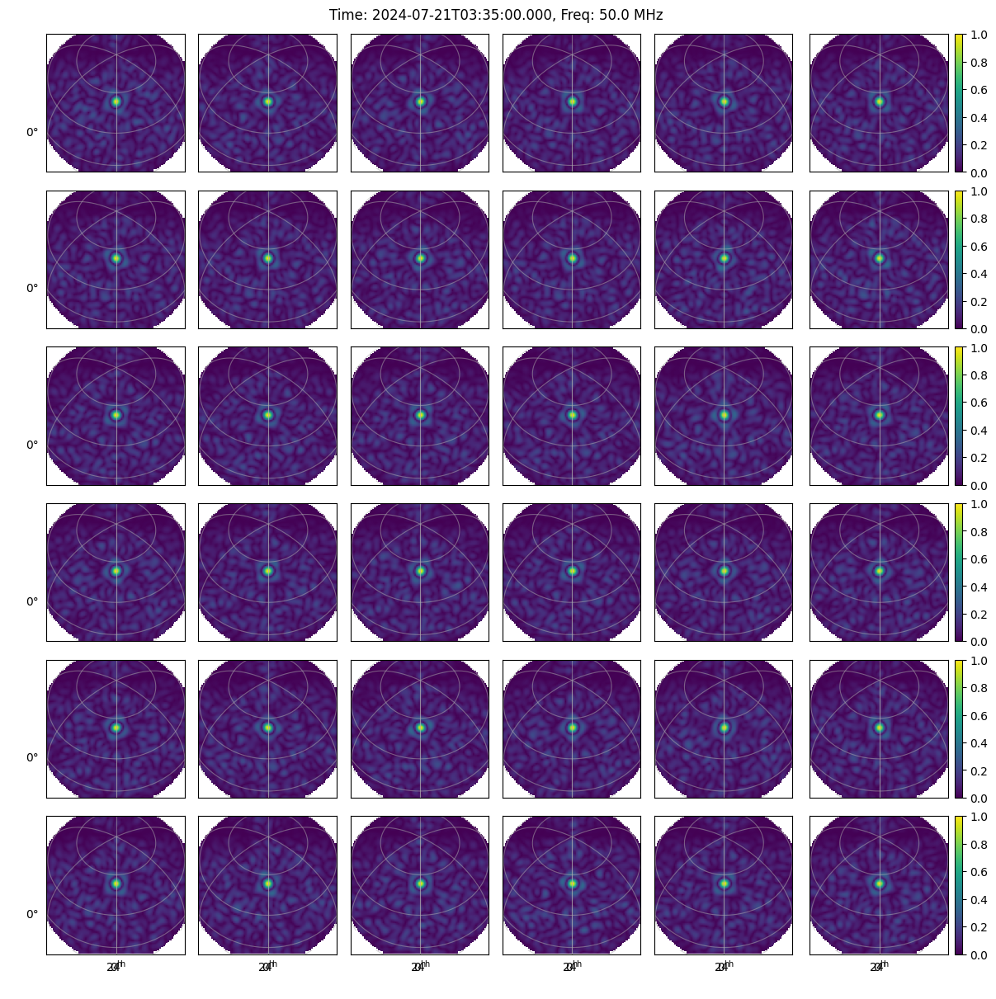

In [16]:
def plot_beam_selection(all_jones, time_ind, freq_ind, nside, wcs):
    fig, axs = plt.subplots(6, 6, figsize=(12, 12), layout='constrained',
                            subplot_kw={'projection': wcs})
    
    for col in range(6):
        for row in range(6):
            beam_ind = col*6 + row
            
            gx = all_jones[beam_ind, time_ind, freq_ind, :, 0,0]
            gx.shape = (nside, nside)
            
            im = axs[row, col].imshow(np.abs(gx), origin='lower', vmax=1, vmin=0)
            
            axs[row, col].grid(alpha=0.5)
            
            lon = axs[row, col].coords[0]
            lat = axs[row, col].coords[1]
            
            lon.set_ticks_visible(False)
            lat.set_ticks_visible(False)
            lon.set_axislabel(' ')
            lat.set_axislabel(' ')
            
            
            if col > 0:
                lat.set_ticklabel_visible(False)
            if row < 5:
                lon.set_ticklabel_visible(False)
                
            if col == 5:
                plt.colorbar(im, ax=axs[row, col])
            

    fig.suptitle(f"Time: {all_times[time_ind].isot}, Freq: {all_freqs[freq_ind]/1e+6} MHz")

    plt.show()

time_ind = 0
freq_ind = 0
plot_beam_selection(all_jones, time_ind, freq_ind, nside, wcs)

Cool, we get a different primary beam shape for each station, they're all normalised to 1. So far so good.

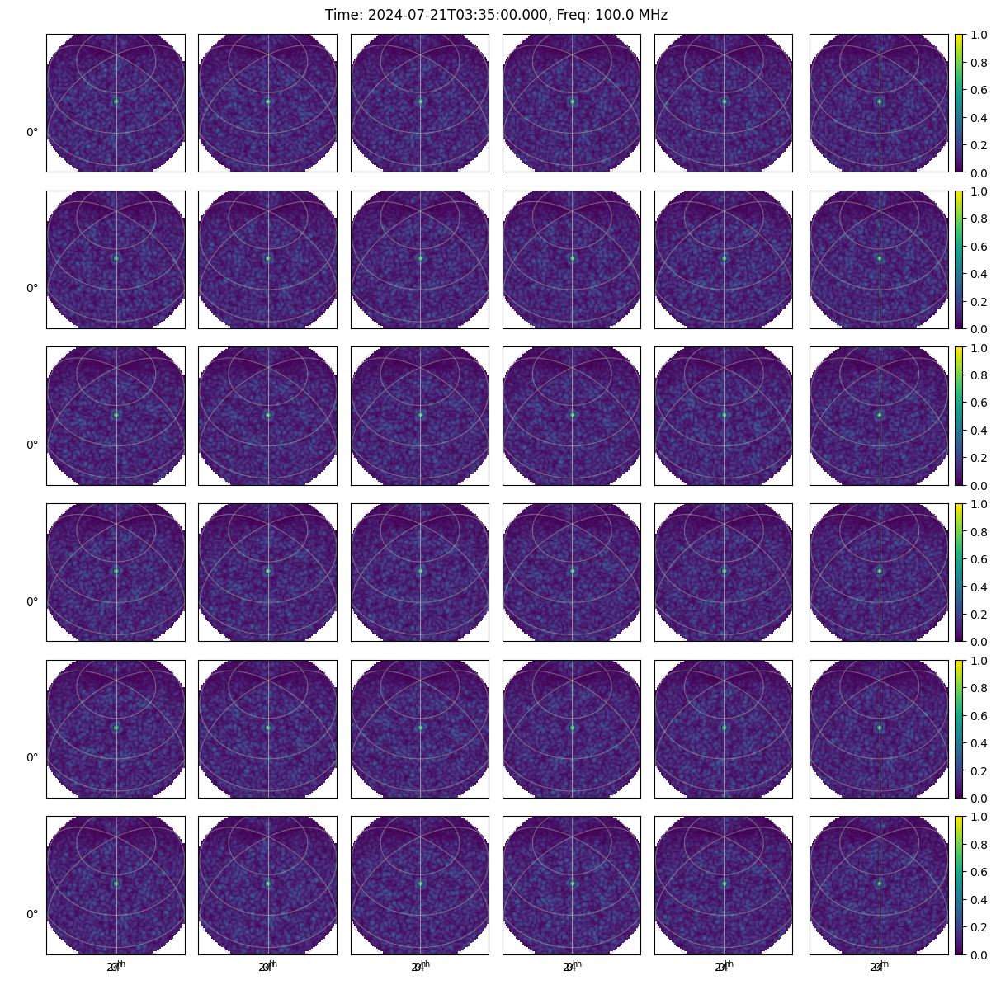

In [17]:
time_ind = 0
freq_ind = 1
plot_beam_selection(all_jones, time_ind, freq_ind, nside, wcs)

Yup, if we switch from 50 to 100MHz the beam gets smaller on the sky, happy days.

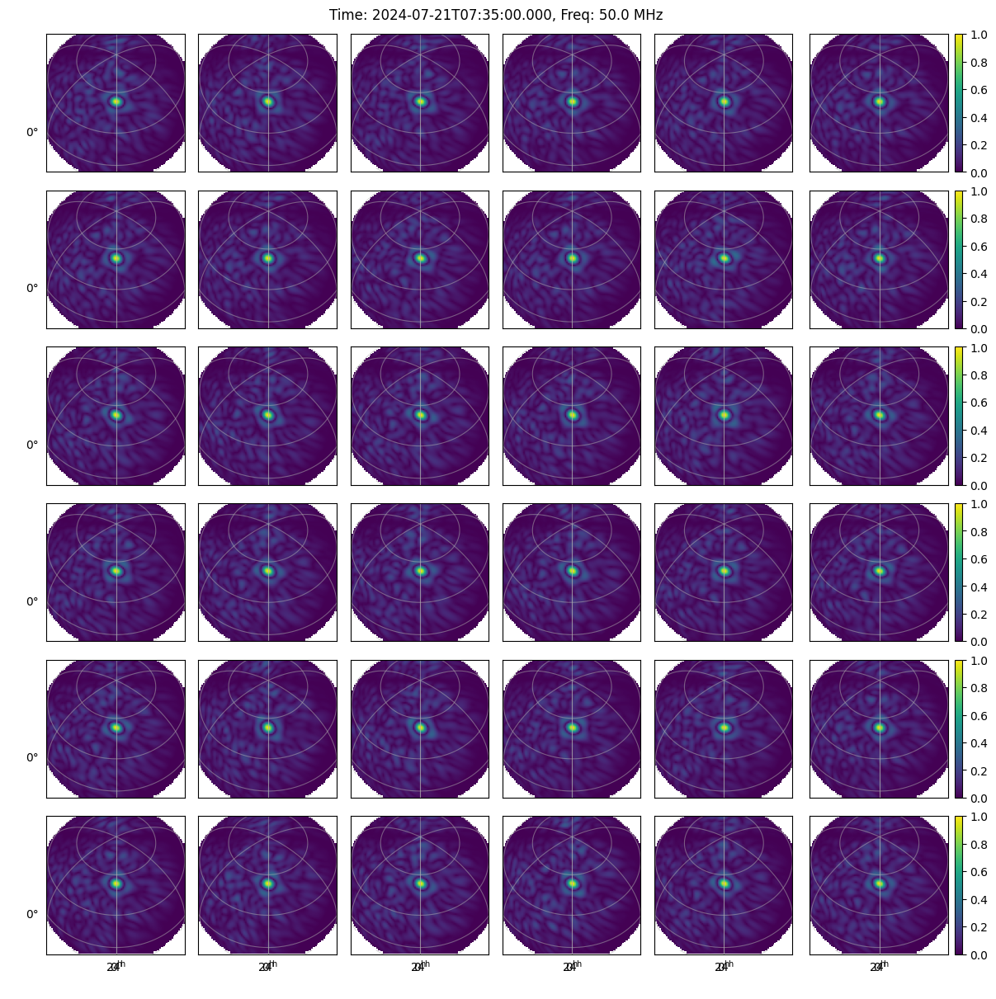

In [18]:
time_ind = 1
freq_ind = 0
plot_beam_selection(all_jones, time_ind, freq_ind, nside, wcs)

Now we've gone from beam at zenith to 4 hours off zenith. We're still plotting with RA/Dec centred on beam, but we can see projection effects so we are defo off zenith.

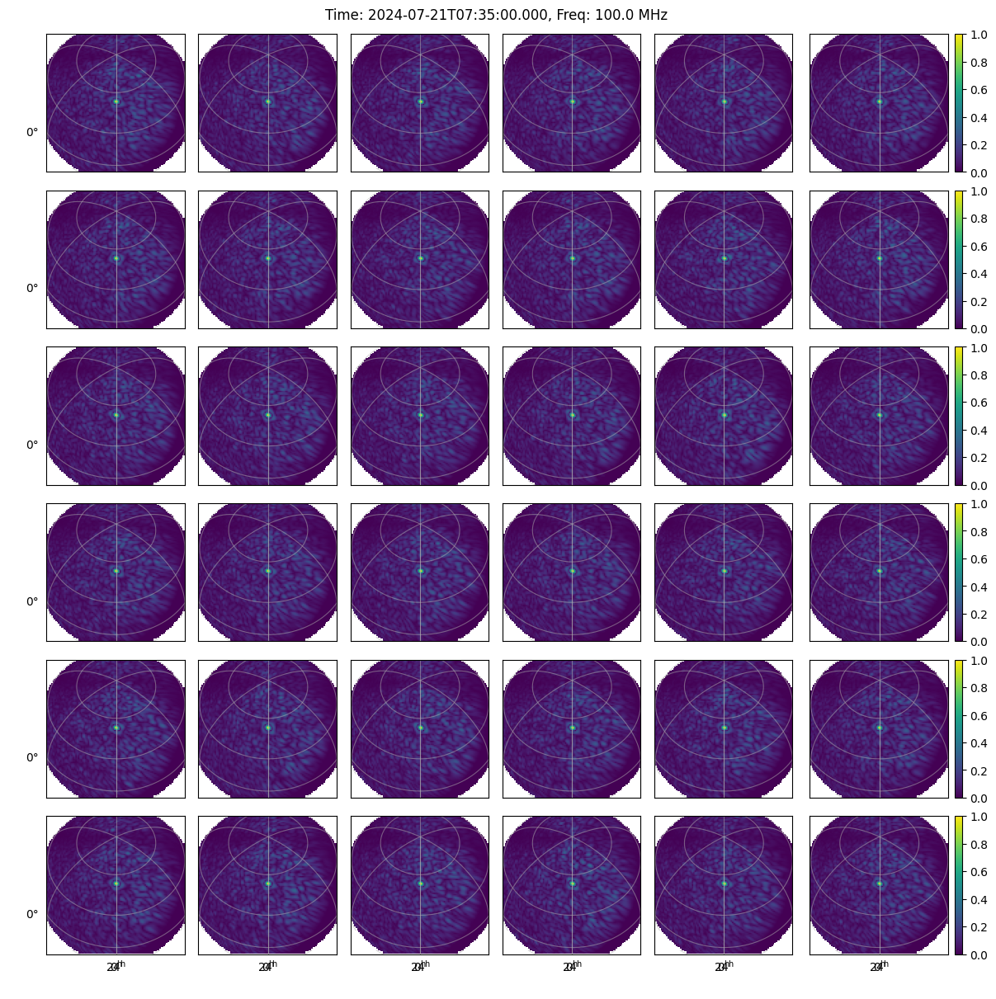

In [19]:
time_ind = 1
freq_ind = 1
plot_beam_selection(all_jones, time_ind, freq_ind, nside, wcs)

And again changing freq changes size. Things are looking good.

## Check positions of components via image
Let's bung a grid of RA/Dec through the whole simulation code, so multiple frequencies and time steps. This should check we're calling the above beam code correctly and integrating things into the code proper.

In [20]:
from astropy.table import Column, Table

nside=11
half_width = 2

ras = np.linspace(ra0 - half_width, ra0 + half_width, nside)
decs = np.linspace(dec0 - half_width, dec0 + half_width, nside)

ras, decs = np.meshgrid(ras, decs)

ras = ras.flatten()
decs = decs.flatten()

num_comps = len(ras)

c_ids = Column(data=np.array(['source']*num_comps), name='UNQ_SOURCE_ID', dtype='|S20')
c_names = Column(data=np.array([f'source_C{i:04d}' for i in range(num_comps)]), name='NAME', dtype='|S20')

##Component position
c_ras = Column(data=ras, name='RA')
c_decs = Column(data=decs, name='DEC')

##This says we have a point source
c_comp_types = Column(data=np.array(['P']*num_comps, dtype='|S1'), name="COMP_TYPE", dtype='|S1')
##This says we have a Stokes I power-law SED
c_mod_types = Column(data=np.array(['pl']*num_comps, dtype='|S3'), name="MOD_TYPE", dtype='|S3')

##Set everything as a flat spectrum 1 Jy stokes I source. That way we can image it and see the beam pattern
c_stokes_I_ref = Column(data=np.ones(num_comps), name='NORM_COMP_PL')
c_stokes_I_SI = Column(data=np.zeros(num_comps), name='ALPHA_PL')


cols = [c_ids, c_names, c_ras, c_decs, c_comp_types, c_mod_types, c_stokes_I_ref, c_stokes_I_SI]

main_table = Table(cols)

cat_name = 'check_positions.fits'

main_table.write(cat_name, format='fits', overwrite=True)

In [21]:
args = []

primary_beam="everybeam_LOFAR"
low_freq=50e+6
num_freq_chans=100
freq_reso=1e+4
uvfits_name=f"check_positions_{primary_beam}"

##The command to run WODEN
args.append(f'--ra0={ra0}')
args.append(f'--dec0={dec0}')
args.append(f'--latitude={lofar_lat}')
args.append(f'--longitude={lofar_long}')
args.append(f'--date={date}')
args.append(f'--output_uvfits_prepend={uvfits_name}')
args.append(f'--cat_filename=check_positions.fits')
args.append(f'--primary_beam={primary_beam}')
args.append(f'--lowest_channel_freq={low_freq}')
args.append(f'--freq_res={freq_reso}')
args.append(f'--num_freq_channels={num_freq_chans}')
args.append(f'--band_nums=1')
args.append(f'--time_res=10')
args.append(f'--num_time_steps=10')
args.append(f'--IAU_order')
args.append(f'--off_cardinal_dipoles')
args.append('--num_threads=8')
args.append(f'--station_id=0')
args.append(f'--beam_ms_path=lba.MS')

run_woden(args)

Successful readonly open of default-locked table lba.MS/ANTENNA: 10 columns, 37 rows
You are using WODEN commit: No git describe nor __version__ avaible
LOADING IN /home/jline/software/WODEN_dev/wodenpy/libwoden_double.so
Setting phase centre RA,DEC 0.00000deg 53.00000deg
Obs epoch initial LST was 0.0395123880 deg
Setting initial J2000 LST to 359.7288967971 deg
Setting initial mjd to 60512.1493634259
After precession initial latitude of the array is 52.7688494985 deg
We are precessing the array
Doing the initial reading/mapping of sky model into chunks
INFO: couldn't find second table containing shapelet information, so not attempting to load any shapelets.
Mapping took 0.0 mins
Have read in 121 components
After cropping there are 121 components
From Set 0 thread num 0 reading 16 points, 0 gauss, 0 shape, 0 shape coeffs using thread id 0From Set 0 thread num 1 reading 16 points, 0 gauss, 0 shape, 0 shape coeffs using thread id 1
From Set 0 thread num 2 reading 16 points, 0 gauss, 0 sha

In [22]:
cmd = "woden_uv2ms.py "
cmd += "  --uvfits_prepend=check_positions_everybeam_LOFAR_band "
cmd += "  --band_nums=1  "

call(cmd, shell=True)

cmd = "wsclean -name check_positions_everybeam_LOFAR -size 2048 2048 -niter 2000 "
cmd += "  -auto-threshold 0.5 -auto-mask 3 "
cmd += "  -pol I -multiscale -weight briggs 0 -scale 0.002 -j 12 -mgain 0.85 "
cmd += "  -no-update-model-required "
cmd += "  check_positions_everybeam_LOFAR_band*.ms "

##My local WSClean installation is borked, so I have to print the command and run it manually
print(cmd)
# call(cmd, shell=True)

/home/jline/software/anaconda3/envs/woden_dev/bin/woden_uv2ms.py:4: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  __import__('pkg_resources').require('wodenpy==2.3.0')
The telescope frame is set to '????', which generally indicates ignorance. Defaulting the frame to 'itrs', but this may lead to other warnings or errors.
The uvw_array does not match the expected values given the antenna positions. The largest discrepancy is 7.191592089709729 meters. This is a fairly common situation but might indicate an error in the antenna positions, the uvws or the phasing.
The uvw_array does not match the expected values given the antenna positions. The largest discrepancy is 7.191592089709729 meters. This is a fairly common situation but might indicate an error in the antenna positions, the uvws or the phasing.
Writing in the MS file that the units of the data are uncalib, although some CASA process will ignore this and assu

wsclean -name check_positions_everybeam_LOFAR -size 2048 2048 -niter 2000   -auto-threshold 0.5 -auto-mask 3   -pol I -multiscale -weight briggs 0 -scale 0.002 -j 12 -mgain 0.85   -no-update-model-required   check_positions_everybeam_LOFAR_band*.ms 


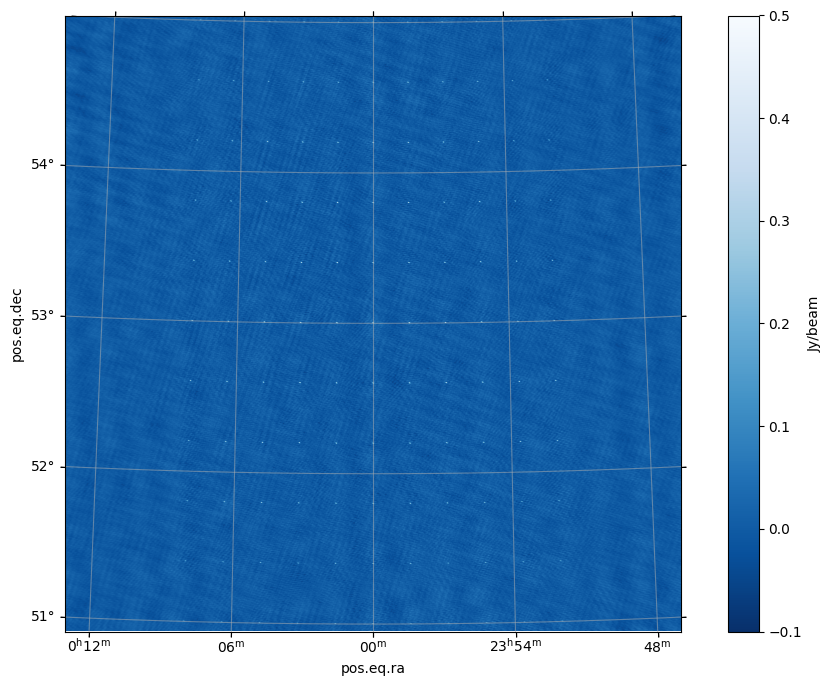

In [23]:

with fits.open('check_positions_everybeam_LOFAR-image.fits') as hdu:
    image = np.squeeze(hdu[0].data)
    wcs = WCS(hdu[0].header).celestial
    
fig, axs = plt.subplots(1, 1, figsize=(12, 8), subplot_kw={'projection': wcs})

im = axs.imshow(image, origin='lower', cmap='Blues_r', vmin=-0.1, vmax=0.5)
plt.colorbar(im, ax=axs, label='Jy/beam')

# half_width = 600

# axs.set_xlim(1024-half_width, 1024+half_width)
# axs.set_ylim(1024-half_width, 1024+half_width)

plt.grid(alpha=0.5)

plt.show()

Fairly ratty image, but we defo have a grid of point source aligned with the celestial sphere, so we're looking fine. I think `lba.MS` is a minimal example of the LBA array so the $uv$ coverage probably isn't great. Actually we can have a look at that:

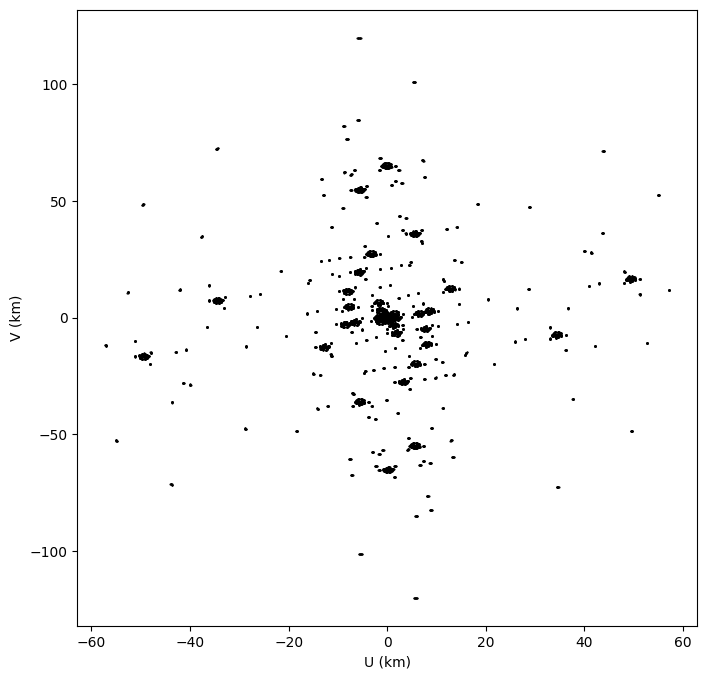

In [24]:
with fits.open('check_positions_everybeam_LOFAR_band01.uvfits') as hdu:
    uu = (hdu[0].data['UU']*c)/1e+3
    vv = (hdu[0].data['VV']*c)/1e+3
    
fig, axs = plt.subplots(1, 1, figsize=(8, 8))
axs.plot(uu, vv, 'k.', ms=1)
axs.plot(-uu, -vv, 'k.', ms=1)
axs.set_xlabel('U (km)')
axs.set_ylabel('V (km)')

plt.show()

Yeah pretty patchy coverage. Amazing resolution though, blimey!

## LoBES vs Hamaker Beams
`WODEN` has been written to default to the `hamaker` beam model for `LOFAR`, but `EveryBeam` also has a `LOBES` beam model. I've defaulted to `hamaker` for the following reasons. First up, we'll plot just the element response, a.k.a just the dipole response as given by the two models for a particular station. We'll switch off parallactic rotation and normalisation to see what the raw element response is.

First up, `hamaker`:

Thread 4 processing coords 5000 to 6250Thread 0 processing coords 0 to 1250Thread 2 processing coords 2500 to 3750
Thread 3 processing coords 3750 to 5000Thread 1 processing coords 1250 to 2500



Thread 5 processing coords 6250 to 7500Thread 7 processing coords 8750 to 10000Thread 6 processing coords 7500 to 8750


Thread 3 finishedThread 0 finished

Thread 4 finishedThread 1 finished
Thread 2 finished
Thread 7 finished

Thread 6 finishedThread 5 finished



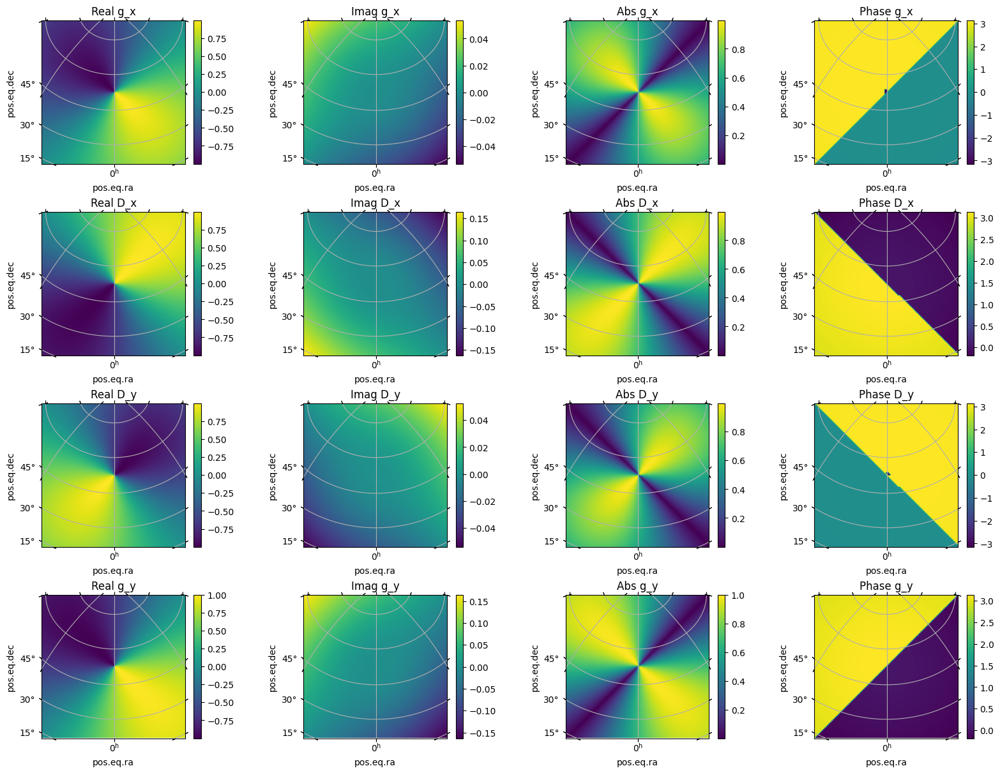

In [26]:
##setup coords
nside = 100
radec_reso = 60 / nside
header, wcs = create_WCS(ra0, dec0, nside, radec_reso)
x_mesh, y_mesh = np.meshgrid(np.arange(nside), np.arange(nside))
ras, decs = wcs.all_pix2world(x_mesh, y_mesh, 0)
ras = np.radians(ras.flatten())
decs = np.radians(decs.flatten())

##Path to example MS
ms_path="lba.MS"

freq = 50e+6
station_id = 0

##Technically we don't need to do this here, but in WODEN proper, we
##precess the array back to J2000 rather than precessing the sky forward
##So doing it here to show you what is happening under the hood
mjd_current = observing_time.mjd
lst_J2000, latitude_J2000 = RTS_Precess_LST_Lat_to_J2000(np.radians(LST_deg),
                                                         np.radians(lofar_lat),
                                                         mjd_current)

##Stick all our variables in lists as `run_everybeam` is designed to be
## run over multiple times/frequencies
j2000_latitudes = [latitude_J2000]
j2000_lsts = [lst_J2000]
times = [observing_time]
freqs = [freq]
station_ids = [20]
##Everybeam doesn't need a coeff path for this beam
coeff_path=""

##We'll run EveryBeam in parallel to speed things up
num_threads=8

all_jones = run_everybeam_over_threads(num_threads, ms_path,
                            coeff_path,
                            ras, decs,
                            np.radians(ra0), np.radians(dec0),
                            j2000_latitudes, j2000_lsts,
                            np.radians(lofar_lat), np.radians(lofar_long),
                            times, freqs, station_ids,
                            use_differential_beam=False,
                            apply_beam_norms=False,
                            reorder_jones=False,
                            parallactic_rotate=False,
                            eb_rotate=False, 
                            element_only=True,
                            element_response_model='hamaker')

beam_ind, time_ind, freq_ind = 0, 0, 0

all_gx = all_jones[beam_ind, time_ind, freq_ind, :, 0, 0]
all_Dx = all_jones[beam_ind, time_ind, freq_ind, :, 0, 1]
all_Dy = all_jones[beam_ind, time_ind, freq_ind, :, 1, 0]
all_gy = all_jones[beam_ind, time_ind, freq_ind, :, 1, 1]

all_gx.shape = (nside, nside)
all_Dx.shape = (nside, nside)
all_Dy.shape = (nside, nside)
all_gy.shape = (nside, nside)

plot_jones_on_sky(all_gx, all_Dx, all_Dy, all_gy, wcs)

Just looking at the absolute values of the gains, we can see that we have two different dipoles, aligned north-east to south-west, and north-west to south-east. This all makes sense.

Now let's plot the `LOBES` beam model:

Thread 1 processing coords 1250 to 2500Thread 5 processing coords 6250 to 7500Thread 0 processing coords 0 to 1250Thread 3 processing coords 3750 to 5000Thread 6 processing coords 7500 to 8750Thread 2 processing coords 2500 to 3750Thread 4 processing coords 5000 to 6250Thread 7 processing coords 8750 to 10000







Creating LOBESElementResponse for station Creating LOBESElementResponse for station Creating LOBESElementResponse for station Creating LOBESElementResponse for station CS017LBA failed because: 
Creating LOBESElementResponse for station Creating LOBESElementResponse for station Creating LOBESElementResponse for station Creating LOBESElementResponse for station Coefficients file /home/jline/software/anaconda3/envs/woden_dev/share/everybeam/lobes/LOBES_CS017LBA.h5 does not exist.CS017LBA
 failed because: 
Switching to HamakerElementResponse instead. Further warnings of this type will be suppressed.
Coefficients file /home/jline/software/anaconda3/envs/woden_dev/share/everybeam

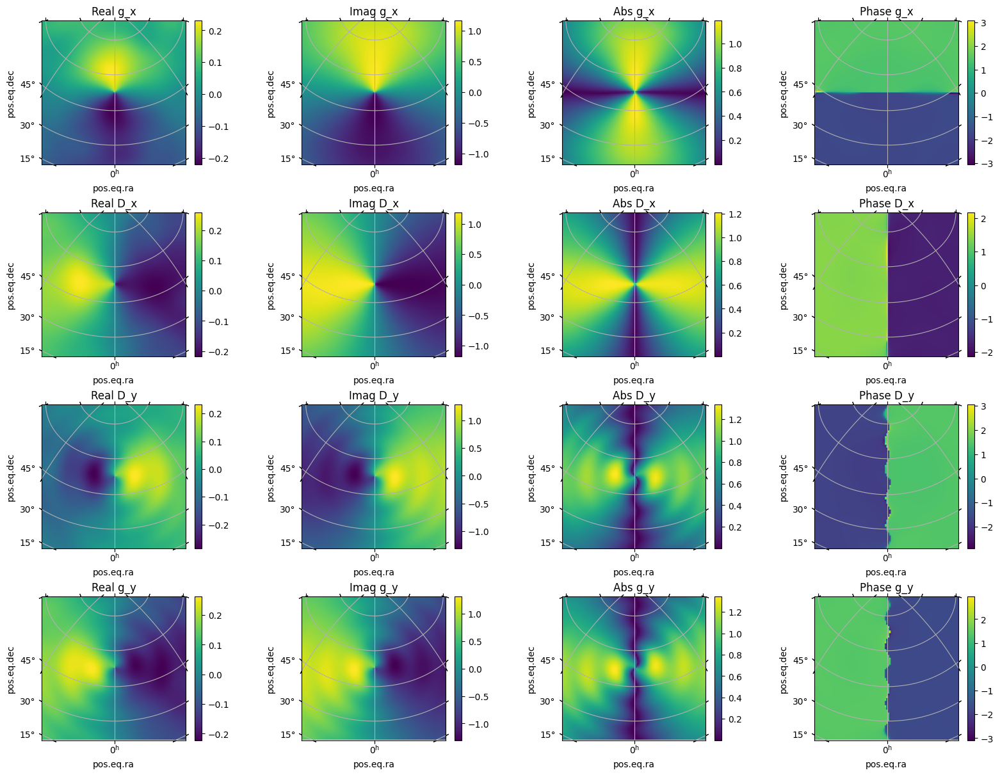

In [27]:
all_jones = run_everybeam_over_threads(num_threads, ms_path,
                            coeff_path,
                            ras, decs,
                            np.radians(ra0), np.radians(dec0),
                            j2000_latitudes, j2000_lsts,
                            np.radians(lofar_lat), np.radians(lofar_long),
                            times, freqs, station_ids,
                            use_differential_beam=False,
                            apply_beam_norms=False,
                            reorder_jones=False,
                            parallactic_rotate=False,
                            eb_rotate=False, 
                            element_only=True,
                            element_response_model='lobes')

beam_ind, time_ind, freq_ind = 0, 0, 0

all_gx = all_jones[beam_ind, time_ind, freq_ind, :, 0, 0]
all_Dx = all_jones[beam_ind, time_ind, freq_ind, :, 0, 1]
all_Dy = all_jones[beam_ind, time_ind, freq_ind, :, 1, 0]
all_gy = all_jones[beam_ind, time_ind, freq_ind, :, 1, 1]

all_gx.shape = (nside, nside)
all_Dx.shape = (nside, nside)
all_Dy.shape = (nside, nside)
all_gy.shape = (nside, nside)

plot_jones_on_sky(all_gx, all_Dx, all_Dy, all_gy, wcs)

Aside from the fact that the elements now seem to be aligned north-south and east-west, three of the jones matrix elements seem to be aligned north-south, and only one east-west. I think `EveryBeam` might handle the whole 45 deg difference between `hamaker` and `LOBES` internally when you ask it to apply parallactic rotation(?). But the three elements aligned one way, one the other cause me grief when I try and normalise the beam. `EveryBeam` has an internal option called `differential_beam`, which is supposed to normalise things. If I set this to `True`, I get the following:

Creating LOBESElementResponse for station CS017LBA failed because: 
Coefficients file /home/jline/software/anaconda3/envs/woden_dev/share/everybeam/lobes/LOBES_CS017LBA.h5 does not exist.
Switching to HamakerElementResponse instead. Further warnings of this type will be suppressed.
Creating LOBESElementResponse for station CS017LBA failed because: 
Coefficients file /home/jline/software/anaconda3/envs/woden_dev/share/everybeam/lobes/LOBES_CS017LBA.h5 does not exist.
Switching to HamakerElementResponse instead. Further warnings of this type will be suppressed.
Thread 4 processing coords 5000 to 6250
Creating LOBESElementResponse for station CS017LBA failed because: 
Coefficients file /home/jline/software/anaconda3/envs/woden_dev/share/everybeam/lobes/LOBES_CS017LBA.h5 does not exist.
Switching to HamakerElementResponse instead. Further warnings of this type will be suppressed.
Creating LOBESElementResponse for station CS017LBA failed because: 
Coefficients file /home/jline/software/anac

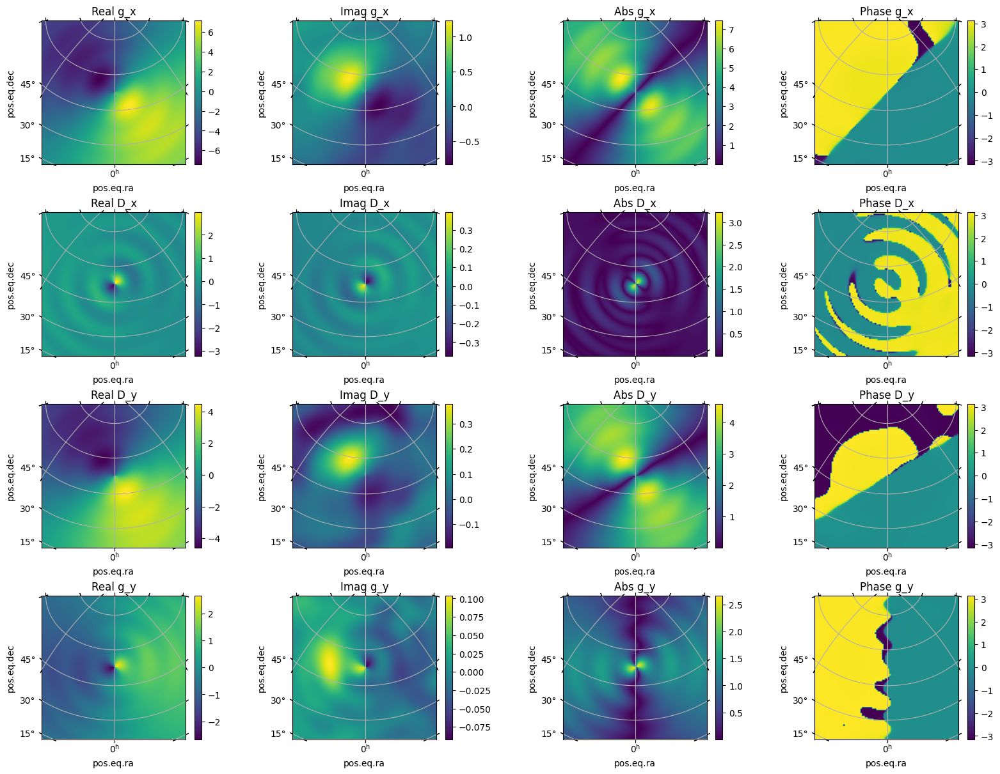

In [28]:
all_jones = run_everybeam_over_threads(num_threads, ms_path,
                            coeff_path,
                            ras, decs,
                            np.radians(ra0), np.radians(dec0),
                            j2000_latitudes, j2000_lsts,
                            np.radians(lofar_lat), np.radians(lofar_long),
                            times, freqs, station_ids,
                            use_differential_beam=True,
                            apply_beam_norms=False,
                            reorder_jones=False,
                            parallactic_rotate=False,
                            eb_rotate=False, 
                            element_only=True,
                            element_response_model='lobes')

beam_ind, time_ind, freq_ind = 0, 0, 0

all_gx = all_jones[beam_ind, time_ind, freq_ind, :, 0, 0]
all_Dx = all_jones[beam_ind, time_ind, freq_ind, :, 0, 1]
all_Dy = all_jones[beam_ind, time_ind, freq_ind, :, 1, 0]
all_gy = all_jones[beam_ind, time_ind, freq_ind, :, 1, 1]

all_gx.shape = (nside, nside)
all_Dx.shape = (nside, nside)
all_Dy.shape = (nside, nside)
all_gy.shape = (nside, nside)

plot_jones_on_sky(all_gx, all_Dx, all_Dy, all_gy, wcs)

Which looks like madness to me. Regardless, if I use the same methods to make a station beam that I've used for `hamaker`, I get the following:

Thread 7 processing coords 8750 to 10000
Thread 5 processing coords 6250 to 7500
Creating LOBESElementResponse for station Creating LOBESElementResponse for station CS017LBA failed because: 
Coefficients file /home/jline/software/anaconda3/envs/woden_dev/share/everybeam/lobes/LOBES_CS017LBA.h5 does not exist.
Switching to HamakerElementResponse instead. Further warnings of this type will be suppressed.
CS017LBA failed because: 
Coefficients file /home/jline/software/anaconda3/envs/woden_dev/share/everybeam/lobes/LOBES_CS017LBA.h5 does not exist.
Switching to HamakerElementResponse instead. Further warnings of this type will be suppressed.
Creating LOBESElementResponse for station CS017LBA failed because: 
Coefficients file /home/jline/software/anaconda3/envs/woden_dev/share/everybeam/lobes/LOBES_CS017LBA.h5 does not exist.
Switching to HamakerElementResponse instead. Further warnings of this type will be suppressed.
Creating LOBESElementResponse for station CS017LBA failed because: 
Co

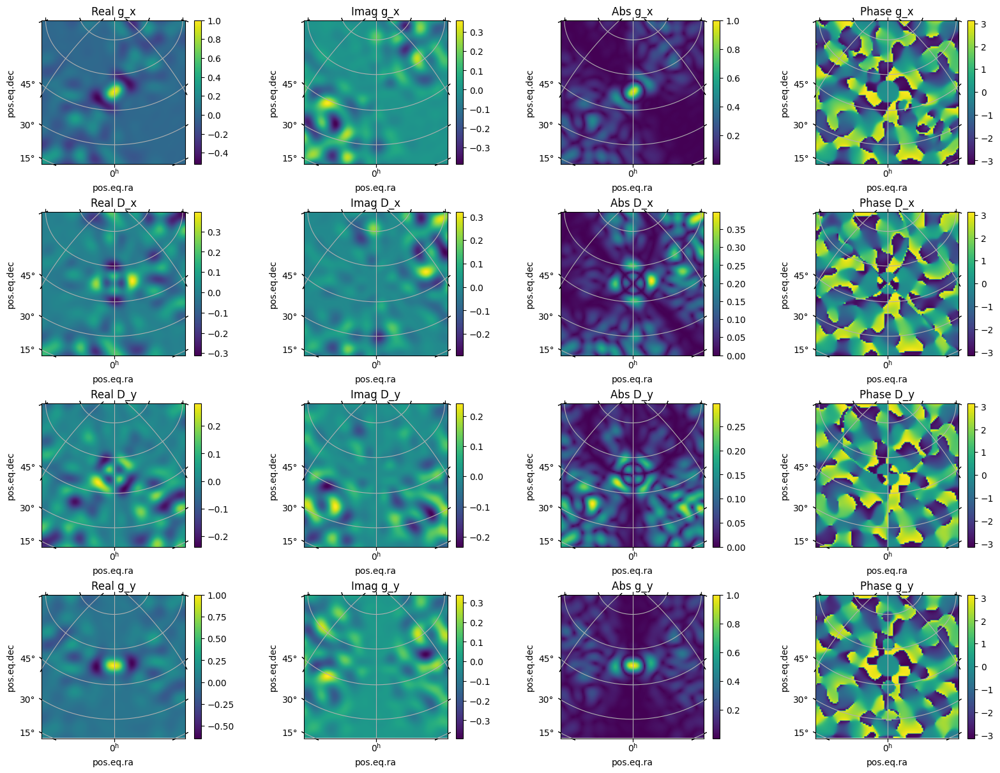

In [31]:
all_jones = run_everybeam_over_threads(num_threads, ms_path,
                            coeff_path,
                            ras, decs,
                            np.radians(ra0), np.radians(dec0),
                            j2000_latitudes, j2000_lsts,
                            np.radians(lofar_lat), np.radians(lofar_long),
                            times, freqs, station_ids,
                            use_differential_beam=False,
                            apply_beam_norms=True,
                            reorder_jones=False,
                            parallactic_rotate=False,
                            eb_rotate=True, 
                            element_only=False,
                            element_response_model='lobes')

beam_ind, time_ind, freq_ind = 0, 0, 0

all_gx = all_jones[beam_ind, time_ind, freq_ind, :, 0, 0]
all_Dx = all_jones[beam_ind, time_ind, freq_ind, :, 0, 1]
all_Dy = all_jones[beam_ind, time_ind, freq_ind, :, 1, 0]
all_gy = all_jones[beam_ind, time_ind, freq_ind, :, 1, 1]

all_gx.shape = (nside, nside)
all_Dx.shape = (nside, nside)
all_Dy.shape = (nside, nside)
all_gy.shape = (nside, nside)

plot_jones_on_sky(all_gx, all_Dx, all_Dy, all_gy, wcs)

The leakages look like a celtic cross, which surely isn't right. If we look at the difference between the two gains:

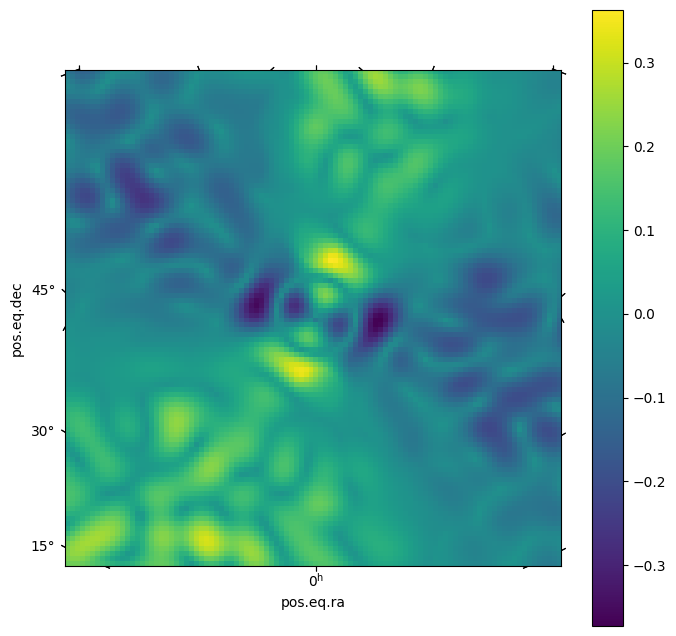

In [35]:
diff = np.abs(all_gx) - np.abs(all_gy)


fig, axs = plt.subplots(1, 1, figsize=(8, 8), subplot_kw={'projection': wcs})

im = axs.imshow(diff, origin='lower')
plt.colorbar(im, ax=axs)
plt.show()

It looks kinda sensible in that the differences are aligned diagonally, as you would expect with off cardinal dipoles. I'm not convinced. I think this needs a `LOFAR` expert to verify if this is what is expected.